<a href="https://colab.research.google.com/github/ctemelkuran/safety-helmet-detection-yolov5/blob/main/AI_Project_2_Safety_Helmet_Detection_Yolov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Artificial Intelligence Project 2 - Safety Helmet Detection Using YOLOv5
## About the Author
Çığır Temelkuran

MSc Information Technology

Ege University, International Computer Institute

ctemelkuran@gmail.com

# Import Libraries

In [ ]:
from xml.dom.minidom import parse
from shutil import copyfile
from pathlib import Path
import pandas as pd
import numpy as np
import os


# Prepare Data for YOLOv5 Format

Mount Google Drive to reach the data set

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive


Mounted at /content/gdrive


Create directories to hold images and txt files for annotations (train , val ,test)

In [ ]:
!mkdir -p "/mydrive/yolov5/Dataset/labels"
!mkdir -p "/mydrive/yolov5/Dataset/images"

Declare classes

In [ ]:
classes = ['helmet','head', 'person']

Calculate anchor points and height, width of bonding boxes

In [ ]:
def convert_annot(size , box):
    x1 = int(box[0])
    y1 = int(box[1])
    x2 = int(box[2])
    y2 = int(box[3])

    dw = np.float32(1. / int(size[0]))
    dh = np.float32(1. / int(size[1]))

    w = x2 - x1
    h = y2 - y1
    x = x1 + (w / 2)
    y = y1 + (h / 2)

    x = x * dw
    w = w * dw
    y = y * dh
    h = h * dh
    return [x, y, w, h]


Save anchor points to txt file

In [ ]:
def save_txt_file(img_jpg_file_name, size, img_box):
    save_file_name = '/mydrive/yolov5/Dataset/labels/' +  img_jpg_file_name + '.txt'
    print(save_file_name)
    file_path = open(save_file_name, "a+")
    with open(save_file_name ,'a+') as file_path:
        for box in img_box:

            cls_num = classes.index(box[0])

            new_box = convert_annot(size, box[1:])

            file_path.write(f"{cls_num} {new_box[0]} {new_box[1]} {new_box[2]} {new_box[3]}\n")

        file_path.flush()
        file_path.close()

In [ ]:
def get_xml_data(file_path, img_xml_file):
    img_path = file_path + '/' + img_xml_file + '.xml'
    print(img_path)

    dom = parse(img_path)
    root = dom.documentElement
    img_name = root.getElementsByTagName("filename")[0].childNodes[0].data
    img_size = root.getElementsByTagName("size")[0]
    objects = root.getElementsByTagName("object")
    img_w = img_size.getElementsByTagName("width")[0].childNodes[0].data
    img_h = img_size.getElementsByTagName("height")[0].childNodes[0].data
    img_c = img_size.getElementsByTagName("depth")[0].childNodes[0].data
   
    img_box = []
    for box in objects:
        cls_name = box.getElementsByTagName("name")[0].childNodes[0].data
        x1 = int(box.getElementsByTagName("xmin")[0].childNodes[0].data)
        y1 = int(box.getElementsByTagName("ymin")[0].childNodes[0].data)
        x2 = int(box.getElementsByTagName("xmax")[0].childNodes[0].data)
        y2 = int(box.getElementsByTagName("ymax")[0].childNodes[0].data)
        
        img_jpg_file_name = img_xml_file + '.jpg'
        img_box.append([cls_name, x1, y1, x2, y2])
  

    save_txt_file(img_xml_file, [img_w, img_h], img_box)

In [ ]:
# Check labels
!ls /mydrive/yolov5/Dataset/labels/

Extract Images and Annotations

The images and annotations need to be inside a zip archive and they need to be inside the folder "yolov5" on Google Drive.


In [ ]:

#!unzip /mydrive/yolov5/images.zip -d /mydrive/yolov5/input/images
#!unzip /mydrive/yolov5/annotations.zip -d /mydrive/yolov5/input

In [ ]:
files = os.listdir('/mydrive/yolov5/input/annotations')
for file in files:
    print("file name: ", file)
    file_xml = file.split(".")
    print(file_xml[0])
    get_xml_data('/mydrive/yolov5/input/annotations', file_xml[0])

# Split images to train, validation and test

In [ ]:
from sklearn.model_selection import train_test_split

image_list = os.listdir("/mydrive/yolov5/input/images")
train_list, test_list = train_test_split(image_list, test_size=0.2, random_state=42)
val_list, test_list = train_test_split(test_list, test_size=0.5, random_state=42)
# Check number of images
print('total :',len(image_list))
print('train :',len(train_list))
print('val   :',len(val_list))
print('test  :',len(test_list))

total = 5000
train : 4000
val   : 500
test  : 500


Create method to copy data

In [ ]:
def copy_data(file_list, img_labels_root, imgs_source, mode):

    root_file = Path( "/mydrive/yolov5/Dataset/images/"+  mode)
    if not root_file.exists():
        print(f"Path {root_file} does not exit")
        os.makedirs(root_file)

    root_file = Path("/mydrive/yolov5/Dataset/labels/" + mode)
    if not root_file.exists():
        print(f"Path {root_file} does not exit")
        os.makedirs(root_file)

    for file in file_list:               
        img_name = file.replace('.png', '')        
        img_src_file = imgs_source + '/' + img_name + '.png'        
        label_src_file = img_labels_root + '/' + img_name + '.txt'

        # Copy image
        DICT_DIR = "/mydrive/yolov5/Dataset/images/"  + mode
        img_dict_file = DICT_DIR + '/' + img_name + '.png'

        copyfile(img_src_file, img_dict_file)

        # Copy label
        DICT_DIR = "/mydrive/yolov5/Dataset/labels/" + mode
        img_dict_file = DICT_DIR + '/' + img_name + '.txt'
        copyfile(label_src_file, img_dict_file)

In [ ]:
copy_data(train_list, "/mydrive/yolov5/Dataset/labels/", "/mydrive/yolov5/input/images", "train")
copy_data(val_list,   "/mydrive/yolov5/Dataset/labels/", "/mydrive/yolov5/input/images", "val")
copy_data(test_list,  "/mydrive/yolov5/Dataset/labels/", "/mydrive/yolov5/input/images", "test")

In [ ]:
# Check folders under images
!ls "/mydrive/yolov5/Dataset/images"

test  train  val


# Get YOLOv5 model by cloning from Github

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 10740, done.
remote: Total 10740 (delta 0), reused 0 (delta 0), pack-reused 10740
Receiving objects: 100% (10740/10740), 10.88 MiB | 24.76 MiB/s, done.
Resolving deltas: 100% (7421/7421), done.
/content/yolov5


In [ ]:
!ls 
!pwd

CONTRIBUTING.md  Dockerfile  LICENSE	requirements.txt  tutorial.ipynb
data		 export.py   models	setup.cfg	  utils
detect.py	 hubconf.py  README.md	train.py	  val.py
/content/yolov5


Create yaml file includes class names for configuration

In [ ]:
import yaml

dict_file = {'train':"/mydrive/yolov5/Dataset/images/train" ,
            'val': "/mydrive/yolov5/Dataset/images/val",
            'nc' : '3',
            'names' : ['helmet','head', 'person']}

with open('/content/yolov5/data/safety_helmet.yaml', 'w+') as file:
    documents = yaml.dump(dict_file, file)

# Train Network Model

In [ ]:
%pip install -qr requirements.txt

import torch
from yolov5 import utils
display = utils.notebook_init()  

YOLOv5 🚀 v6.0-218-g7539cd7 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.2/78.2 GB disk)


In [ ]:
# Check if Google Cloud GPU is enabled
!nvidia-smi

# Check Cpu info
!cat /proc/cpuinfo

Sat Jan 29 13:36:19 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.46       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Weights & Biases for better visualization of results
%pip install -q wandb

     |████████████████████████████████| 1.7 MB 7.6 MB/s 
     |████████████████████████████████| 180 kB 43.9 MB/s 
     |████████████████████████████████| 143 kB 54.1 MB/s 
     |████████████████████████████████| 97 kB 5.0 MB/s 
     |████████████████████████████████| 63 kB 1.9 MB/s 


In [ ]:
!python train.py \
  --project helmet-detection-yolov5n \
  --upload_dataset --save-period 2 \
  --img 416 --batch 32 --epochs 30 \
  --data data/safety_helmet.yaml --cfg models/yolov5n.yaml \
  --weights yolov5n.pt \
  --bbox_interval 1

Streaming output truncated to the last 5000 lines.
val: WARNING: /mydrive/yolov5/Dataset/images/val/hard_hat_workers3503.png: 14 duplicate labels removed
val: WARNING: /mydrive/yolov5/Dataset/images/val/hard_hat_workers3507.png: 2 duplicate labels removed
val: WARNING: /mydrive/yolov5/Dataset/images/val/hard_hat_workers3528.png: 1 duplicate labels removed
val: WARNING: /mydrive/yolov5/Dataset/images/val/hard_hat_workers3541.png: 2 duplicate labels removed
val: WARNING: /mydrive/yolov5/Dataset/images/val/hard_hat_workers3550.png: 2 duplicate labels removed
val: WARNING: /mydrive/yolov5/Dataset/images/val/hard_hat_workers3555.png: 4 duplicate labels removed
val: WARNING: /mydrive/yolov5/Dataset/images/val/hard_hat_workers3569.png: 6 duplicate labels removed
val: WARNING: /mydrive/yolov5/Dataset/images/val/hard_hat_workers3570.png: 4 duplicate labels removed
val: WARNING: /mydrive/yolov5/Dataset/images/val/hard_hat_workers3575.png: 1 duplicate labels removed
val: WARNING: /mydrive/yolov5/

In [ ]:
# Zip to download project
!zip -r /content/yolov5/helmet-detection-yolov5n.zip /content/yolov5/helmet-detection-yolov5n

  adding: content/yolov5/helmet-detection-yolov5n/ (stored 0%)
  adding: content/yolov5/helmet-detection-yolov5n/exp/ (stored 0%)
  adding: content/yolov5/helmet-detection-yolov5n/exp/val_batch1_labels.jpg (deflated 6%)
  adding: content/yolov5/helmet-detection-yolov5n/exp/results.png (deflated 9%)
  adding: content/yolov5/helmet-detection-yolov5n/exp/labels.jpg (deflated 18%)
  adding: content/yolov5/helmet-detection-yolov5n/exp/opt.yaml (deflated 44%)
  adding: content/yolov5/helmet-detection-yolov5n/exp/hyp.yaml (deflated 44%)
  adding: content/yolov5/helmet-detection-yolov5n/exp/F1_curve.png (deflated 9%)
  adding: content/yolov5/helmet-detection-yolov5n/exp/val_batch2_labels.jpg (deflated 5%)
  adding: content/yolov5/helmet-detection-yolov5n/exp/results.csv (deflated 82%)
  adding: content/yolov5/helmet-detection-yolov5n/exp/val_batch0_labels.jpg (deflated 6%)
  adding: content/yolov5/helmet-detection-yolov5n/exp/weights/ (stored 0%)
  adding: content/yolov5/helmet-detection-yolov

# Show Training Results

In [ ]:
# Start tensorboard
%load_ext tensorboard
%tensorboard --logdir helmet-detection-yolov5n

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
from google.colab.patches import cv2_imshow

# Detection experiment 

In [ ]:
!python detect.py --source /content/gdrive/MyDrive/yolov5/Dataset/images/test  --weights /content/gdrive/MyDrive/yolov5/weights/best.pt --conf 0.25
#!python detect.py --weights safety-helmet-detection-yolov5/exp/weights/best.pt --conf 0.25 --source /mydrive/yolov5/Dataset/images/test 


detect: weights=['/content/gdrive/MyDrive/yolov5/weights/best.pt'], source=/content/gdrive/MyDrive/yolov5/Dataset/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-218-g7539cd7 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients
image 1/941 /content/gdrive/MyDrive/yolov5/Dataset/images/test/hard_hat_workers1004.png: 640x640 7 helmets, Done. (0.034s)
image 2/941 /content/gdrive/MyDrive/yolov5/Dataset/images/test/hard_hat_workers1012.png: 640x640 5 helmets, Done. (0.034s)
image 3/941 /content/gdrive/MyDrive/yolov5/Dataset/images/test/hard_hat_workers1023.png: 640x

In [ ]:
# Zip runs to download to local
!zip -r /content/safety-helmet-detection-yolov5-detection.zip /content/yolov5/runs

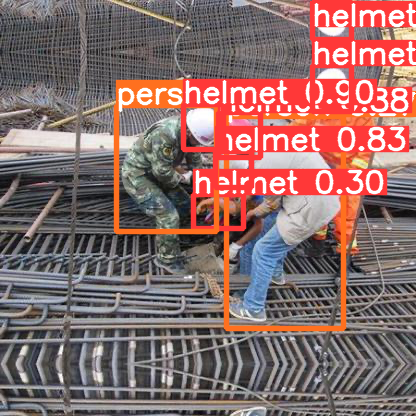

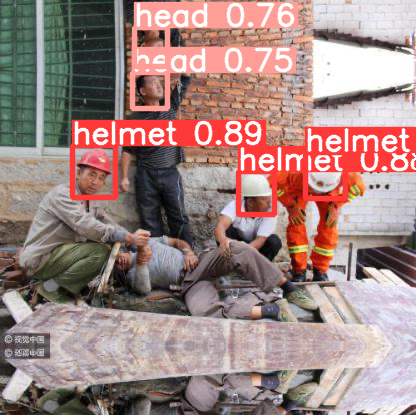

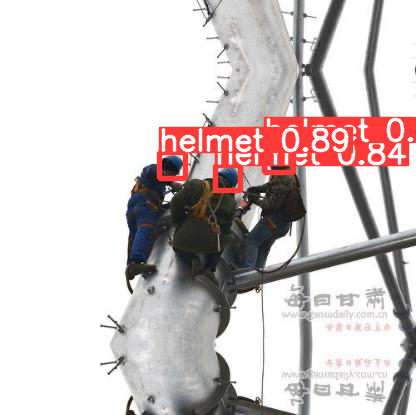

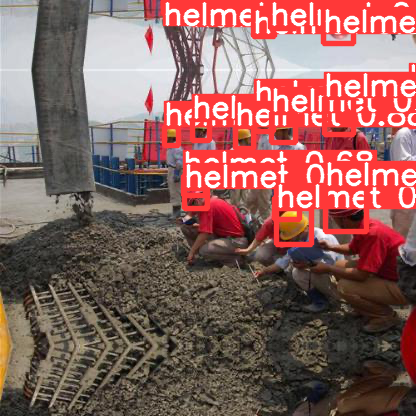

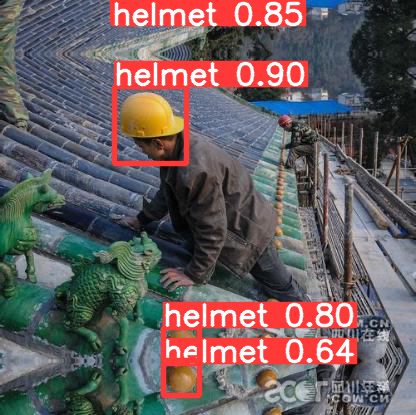

...

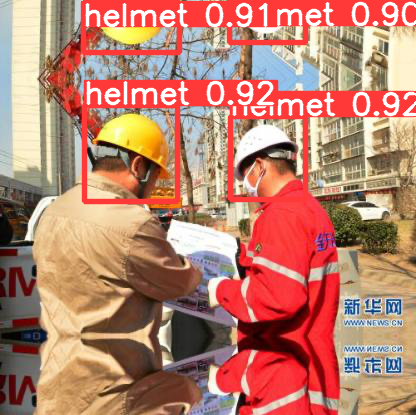

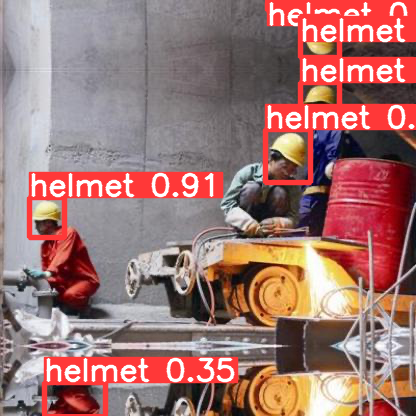

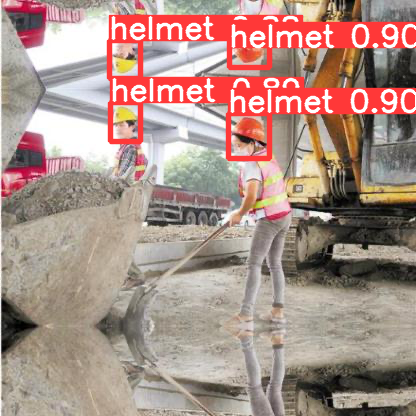

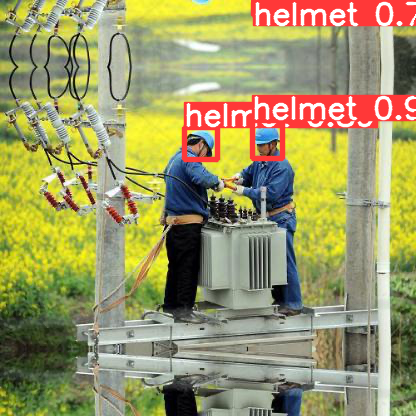

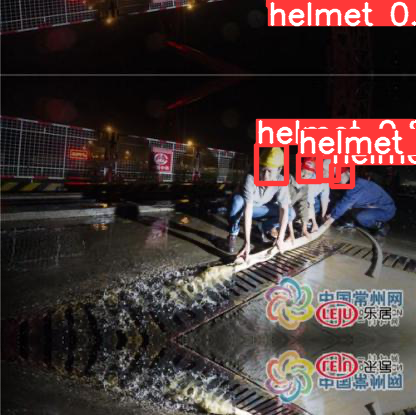

In [ ]:
# display detected images
from IPython.display import Image, display
import matplotlib.pyplot as plt
import glob
# testfiles = glob('runs/detect/exp/*')

# img = plt.imread(testfiles[33]) 
# plt.imshow(img)    
# plt.show

i = 0

for imageName in glob.glob('runs/detect/exp5/*'):
  i+= 1

  if i > 20 and i < 40:
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
from google.colab import files
# Download experiment results
files.download("/content/yolov5/runs/exp3.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>